## Training and Evaluating Generative Adversarial Network on Generated MCMC Samples

This notebook contains examples of the following:
1. Train a Wasserstein GAN on MCMC Sampling results
2. Use the train model to generate samples from the learned distribution
3. Evalute the trained models on several distribution metrics.

#### Enviornment Setup

You may refer to reqirement.txt for specific package versions.

In [5]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pickle
import wandb

from process_data import *
from generative_model import WGAN_SIMPLE

### Model Training

#### Model inputs

Lets define some inputs for the model training:
- dataroot - the path to the root of the dataset
- savepath - save path for trianed model check points
- workers - the number of worker threads for loading the data with the DataLoader
- batch_size - the batch size used in training. 
- num_epochs - number of training epochs to run. Training for longer will probably lead to better results but will also take much longer
- lr - learning rate for training.
- beta1 - beta1 hyperparameter for Adam optimizers.

In [ ]:
dataroot = './data/Rayleigh_P30_downsampled_flat_extended.csv'
savepath = "./model"
workers = 1
batch_size = 128
num_epochs = 200
lr = 0.0002
beta1 = 0.5
device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

In [ ]:
# configure parameter for parameter logging on wandb.ai
config = dict(
        learning_rate=lr,
        momentum=beta1,
        training_epoch=num_epochs,
        batch_size = batch_size,
        architecture="WGAN_MLP",
        data="Rayleigh P30 last 3 runs",
        device = device
    )
wandb.init(project="mcmc-wgan-simple",
               notes = "hyperparameter tuning",
               config=config)

#### Load the data and construct pytorch dataloader

Pytorch provides easy-to-use API for loading custom dataset for automatic batch data loading that faciliates Neural Network batch optimization. For more details, please refer to process_data.py or [Pytorch's official tutorial](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html).

In [7]:
data = np.genfromtxt('./data/Rayleigh_P30_downsampled_flat_extended.csv', delimiter=',', skip_header=True)

Standarize data to range [-1,1], and save the data's mean and standard deviation of later inversion.

In [10]:
recompute_scaler = True
if recompute_scaler:
    scaler = MinMaxScaler((1,data.shape[1]))
    scaler.fit(data)
    scaler_file = open('./data/whole_scaler_extended.pkl', 'wb')
    pickle.dump(scaler, scaler_file)
else:
    scaler_file = open('./data/whole_scaler_extened.pkl', 'rb')
    scaler = pickle.load(scaler_file)

data = scaler.transform(data)

In [ ]:
map_dataset = Africa_Whole_Flat(data)
dataloader = DataLoader(map_dataset, batch_size=config['batch_size'],
                            shuffle=True, num_workers=workers)

#### Initialize Model and Start Training

In [ ]:
model = WGAN_SIMPLE(ndim=data.shape[1],device=device)

model.optimize(dataloader, epochs=config['training_epoch'], 
                lr=config['learning_rate'], beta1=config['momentum'], device=device)

### Load Trained Model and Produce Samples

In [32]:
# load the saved model file
model = WGAN_SIMPLE(ndim=data.shape[1])
checkpoint = torch.load('./model/WGAN_Simple_lr0.0002_beta0.5_last210000/WGAN_Simple_epoch199.model')
model.load_state_dict(checkpoint["model_state_dict"])

<All keys matched successfully>

In [33]:
# generate 10,000 mcmc samples using trained WGAN
fake_data = np.zeros((100000,2382))
for i in range(1000):
    left_idx = 100 * i
    right_idx = 100 * (i+1)
    fake_data[left_idx:right_idx,:] = \
            model.gen(torch.randn(100, model.nlatent, device="cpu")).detach().numpy()

# scale the generated data back to data range
fake_data_scaled = scaler.inverse_transform(fake_data)

### Visualize and Evaluate Generated Samples

First, load necessary package for ploting and the data cordinate for visualization

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

data = np.genfromtxt('./data/Rayleigh_P30_downsampled_flat_extended.csv',delimiter=',',skip_header=True)
cord = np.genfromtxt('./data/downsampled_points.csv',delimiter=',',skip_header=True)
scaler_file = open('./data/whole_scaler_extended.pkl', 'rb')
scaler = pickle.load(scaler_file)

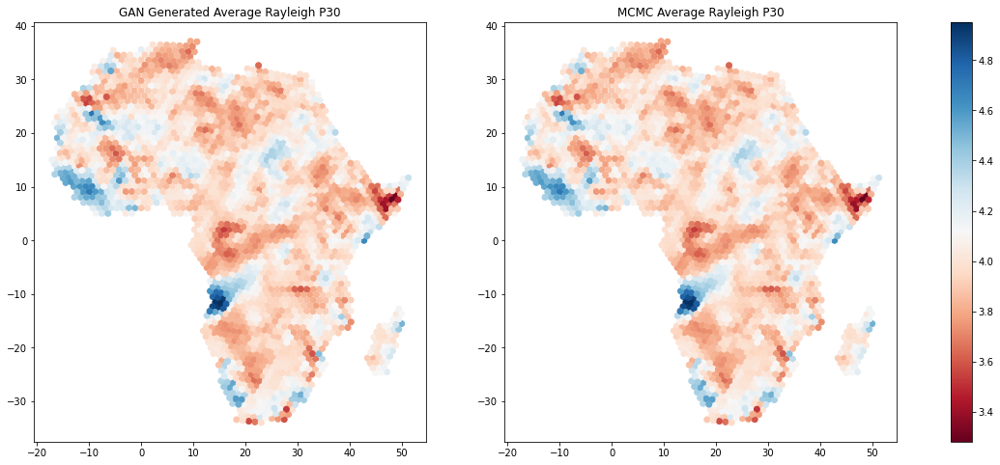

In [39]:
# compute the average of MCMC samples and GAN Generated Samples
avg = np.mean(data,axis=0)
fake_avg = np.mean(fake_data_scaled,axis=0)

# plot 
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_avg,cmap='RdBu')
axes[0].set_title('GAN Generated Average Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=avg,cmap='RdBu')
axes[1].set_title('MCMC Average Rayleigh P30')
plt.colorbar(fig_real,ax=axes)

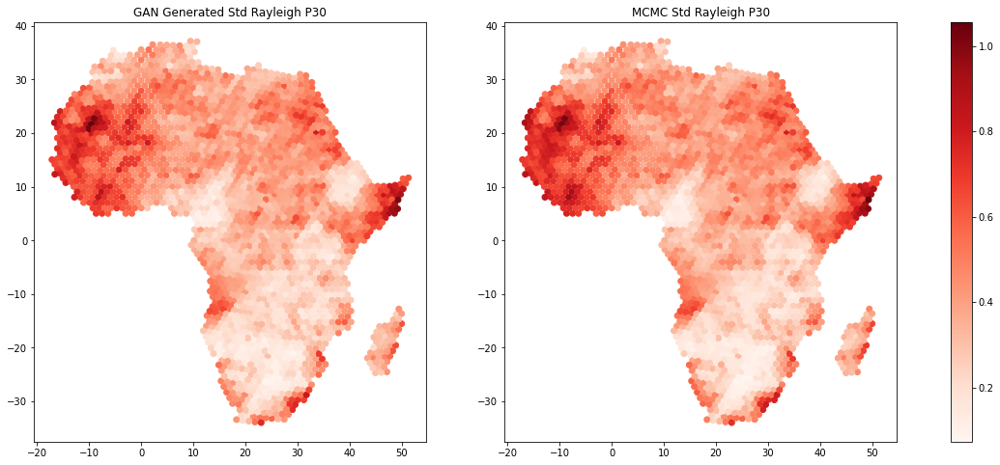

In [40]:
# compute std
real_std = np.std(data,axis=0)
fake_std = np.std(fake_data_scaled,axis=0)

# plot
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_std,cmap='Reds') 
axes[0].set_title('GAN Generated Std Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=real_std,cmap='Reds') 
axes[1].set_title('MCMC Std Rayleigh P30') 
plt.colorbar(fig_real,ax=axes)

368 points(15.45%) skewed different direction


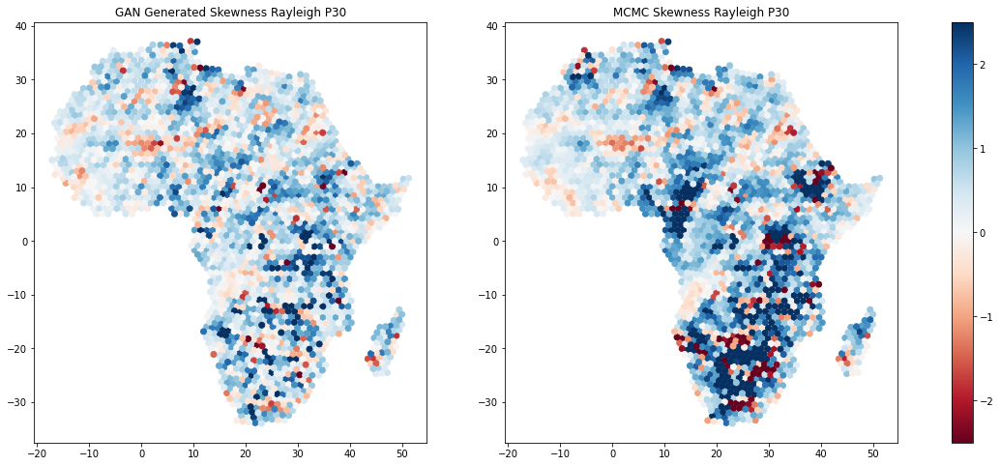

In [45]:
# compute skewness
from scipy.stats import skew
import matplotlib.colors as colors
real_skew = skew(data,axis=0)
fake_skew = skew(fake_data_scaled,axis=0)

# plot
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
normalize = colors.Normalize(vmin=-2.5,vmax=2.5)
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_skew,cmap='RdBu',norm=normalize) 
axes[0].set_title('GAN Generated Skewness Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=real_skew,cmap='RdBu',norm=normalize) 
axes[1].set_title('MCMC Skewness Rayleigh P30') 
plt.colorbar(fig_real,ax=axes)

skew_diff_count = np.sum(fake_skew*real_skew<0)
print("{} points({:.2%}) skewed different direction".format(skew_diff_count, skew_diff_count/data.shape[1]))

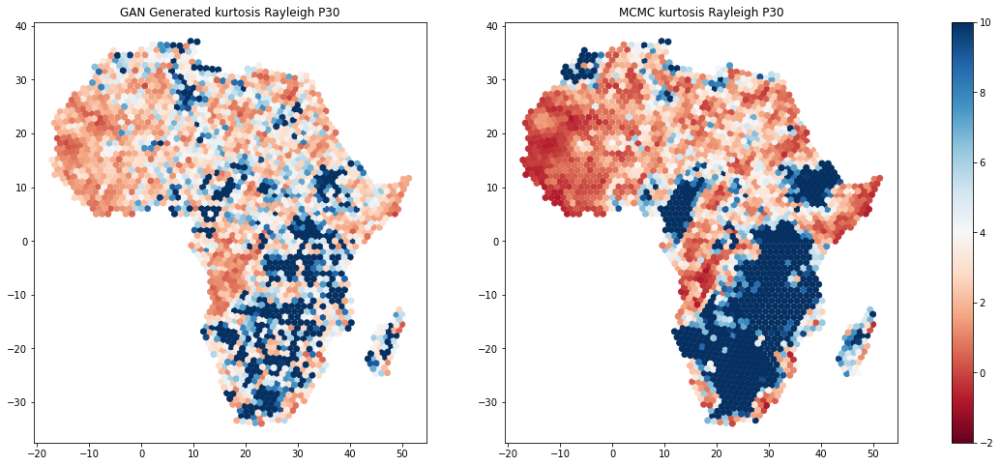

In [46]:
# compute kurtosis
from scipy.stats import kurtosis
real_kurtosis = kurtosis(data,axis=0) 
fake_kurtosis = kurtosis(fake_data_scaled,axis=0)

# plot
fig, axes = plt.subplots(1,2,figsize=(20,8))
axes = axes.flatten()
normalize = colors.Normalize(vmin=-2,vmax=10)
fig_fake = axes[0].scatter(cord[:,0],cord[:,1],c=fake_kurtosis,cmap='RdBu',norm=normalize) 
axes[0].set_title('GAN Generated kurtosis Rayleigh P30')
fig_real = axes[1].scatter(cord[:,0],cord[:,1],c=real_kurtosis,cmap='RdBu',norm=normalize) 
axes[1].set_title('MCMC kurtosis Rayleigh P30') 
plt.colorbar(fig_real,ax=axes)

We use Earth Mover Distance(Wasserstein distance) to measure the distance between the distribution of each points of the generated samples from that of MCMC samples.

In [47]:
from scipy.stats import wasserstein_distance as EMD

# compute the EMD between locations
distance = np.zeros(data.shape[1])
for i in range(data.shape[1]):
    distance[i] = EMD(data[:,i],fake_data_scaled[:,i])

In [48]:
# generate a list of random locations to visualize marginal distributions
location_idxes = np.random.randint(low=0,high=data.shape[1],size=16)

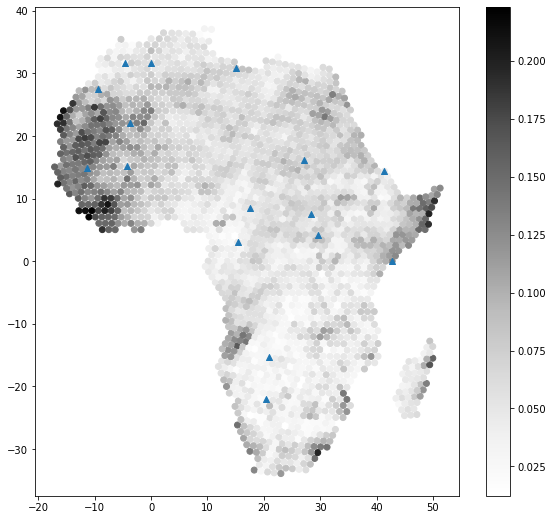

In [49]:
# plot EMD and locations
fig = plt.figure(figsize=(9.5,9))
plt.scatter(cord[:,0],cord[:,1],c=distance,cmap='Greys')
plt.colorbar()
plt.scatter(cord[location_idxes,0],cord[location_idxes,1],marker='^',cmap='RdBu')
plt.show()

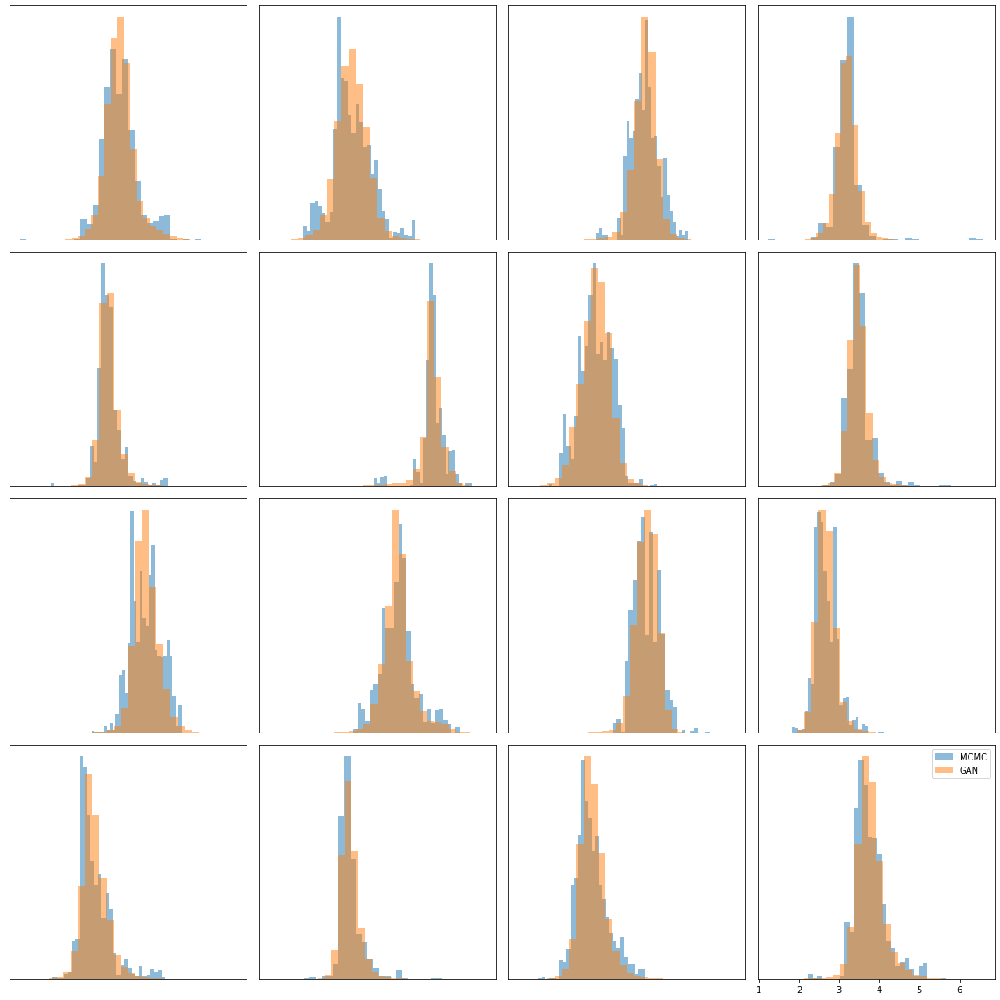

In [54]:
# plot marginals at locations
fig,axes = plt.subplots(4,4,figsize=(16,16))
bins = 30
axes=axes.flatten()
for i,ax in enumerate(axes):
    ax.hist(data[:,location_idxes[i]],bins = 30,density=True,label='MCMC',alpha=0.5)
    ax.hist(fake_data_scaled[:,location_idxes[i]],bins = 30, density=True,label='GAN', alpha=0.5)
    if i != 15: ax.set_xticks([])
    ax.set_yticks([])
plt.legend()
plt.tight_layout()

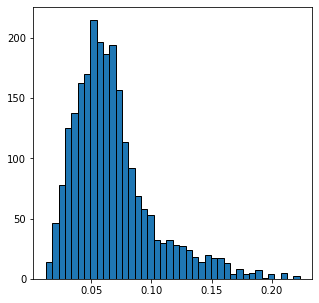

0.29% of points exceeds 0.2 EMD distance


In [62]:
#plot the histogram of EMD
plt.figure(figsize=(5,5))
plt.hist(distance,bins=40,edgecolor="black")
plt.show()
print("{:.2%} of points exceeds 0.2 EMD distance".format(np.sum(distance>0.2)/data.shape[1]))

Evaluate the corvariance relationship

In [63]:
real_cov = np.cov(data.T)
fake_cov = np.cov(fake_data_scaled.T)

678732 pairs (12%) covariate different direction


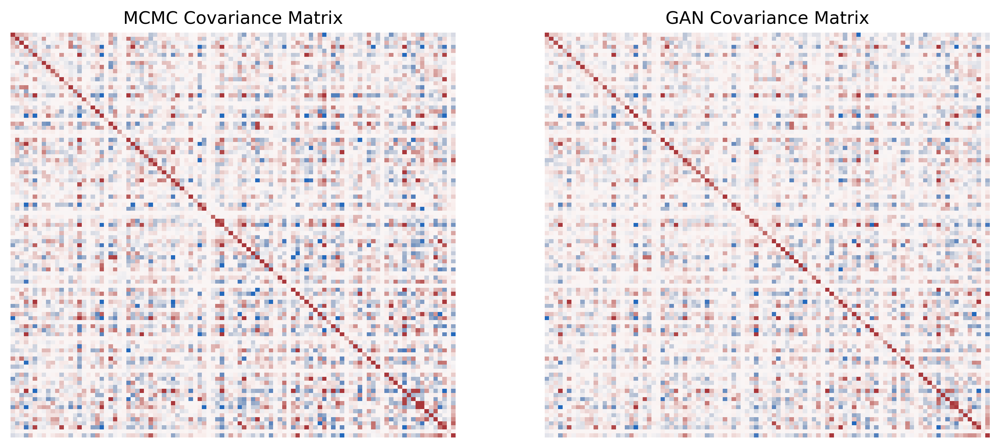

In [74]:
stop = 100

cov_subset = real_cov[:stop,:stop]
cov_subset_fake = fake_cov[:stop,:stop]


fig, axes = plt.subplots(1,2,figsize=(12,5),dpi=300)
axes = axes.flatten()

hm = sns.heatmap(cov_subset,
                 center=0,
                 vmax=0.1,
                 vmin=-0.1,
                 cmap='vlag',ax=axes[0],cbar=False)
axes[0].set_title('MCMC Covariance Matrix')
hm = sns.heatmap(cov_subset_fake,
                 center=0,
                 vmax=0.1,
                 vmin=-0.1,
                 cmap='vlag',ax=axes[1],cbar=False)
axes[1].set_title('GAN Covariance Matrix')
axes[0].axis('off')
axes[1].axis('off')
diff_dire_count = np.sum(fake_cov*real_cov<0)
print("{} pairs ({:.0%}) covariate different direction".format(diff_dire_count,diff_dire_count/(2382*2382)))

# plt.tight_layout()

Text(-270, 10, 'GAN')

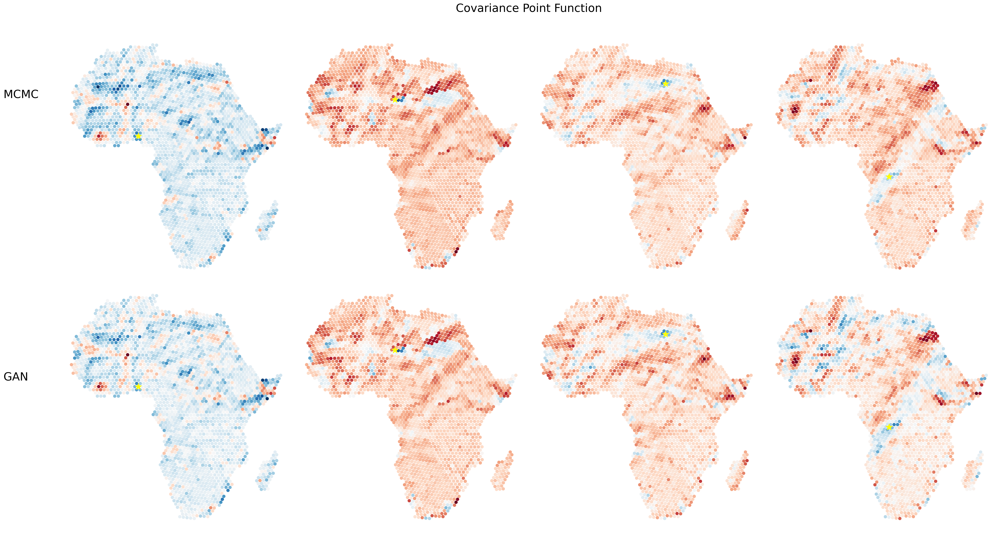

In [65]:
plt.style.use('default')

# covariance point spread functions
idxes = [10,100,1000,2000]

fig, axes = plt.subplots(2,4,figsize=(28,15),dpi=300)

for i in range(4):
    # plot covariance
    axes[0][i].scatter(cord[:,0],cord[:,1],c=real_cov[idxes[i]],cmap='RdBu')
    axes[1][i].scatter(cord[:,0],cord[:,1],c=fake_cov[idxes[i]],cmap='RdBu')
    # plot point
    axes[0][i].scatter(cord[idxes[i],0],cord[idxes[i],1],s=200,marker='*',c='yellow')
    axes[1][i].scatter(cord[idxes[i],0],cord[idxes[i],1],s=200,marker='*',c='yellow')
    # turn off axis
    axes[0][i].axis('off')
    axes[1][i].axis('off')

axes[0][0].set_ylabel("MCMC")
axes[1][0].set_ylabel("GAN")

plt.tight_layout()
plt.suptitle("Covariance Point Function",y = 1.05,fontsize=24)
plt.text(-270,100,"MCMC",fontsize=24)
plt.text(-270,10,"GAN",fontsize=24)